# Barnsley-Fern leaf fractal pattern

See the [Wikipedia page](https://en.wikipedia.org/wiki/Barnsley_fern) for reference.

### Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.animation import FuncAnimation
plt.rcParams["animation.html"] = "jshtml"

import ipywidgets as widgets
from ipywidgets import interact, interact_manual

### Variables
- transition matrices and their probabilities: they define the shape of the 'leaf';
- number of iterations $N$;
- starting point $x$.

For later convenience, store all the coefficients into an array.

In [9]:
a = np.array([
    0,      0,      0,    .16,     0,      0,    .01,
  .85,    .04,   -.04,    .85,     0,    1.6,    .85,
   .2,   -.26,    .23,    .22,     0,    1.6,    .07,
 -.15,    .28,    .26,    .24,     0,    .44,    .07
])

def from_array(a):
    assert len(a)==4*7
    matrices = []
    quotes = []
    probs = []
    for i in range(4):
        matrix = np.matrix( a[7*i:7*i+4].reshape(2,2) )
        quote = np.matrix( a[7*i+4:7*i+6].reshape(2,1))
        prob = a[7*i+6]
        matrices.append(matrix)
        quotes.append(quote)
        probs.append(prob)
    return matrices, quotes, probs

mats, quotes, probs = from_array(a)
print(mats[-1])
print(quotes[-1])
print(probs[-1])

x = np.matrix([[0.00],
               [0.00]]) # note: it is a column vector

N = 10000


[[-0.15  0.28]
 [ 0.26  0.24]]
[[0.  ]
 [0.44]]
0.07


### Algorithm

In [5]:
def algorithm(mats=mats, quotes=quotes, probs=probs, N=N, x=x):
    #cumulative probabilities
    cumulatives = [sum(probs[:i+1]) for i in range(len(probs))]
    #time series of points
    points = np.empty((N+1,2))
    points[0] = x.T # note: save it as a row vector

    if N>0:
        for n in range(1, N+1):
            # extract a random matrix and apply it to [x,1]
            r = np.random.random()
            for c,M,q in zip(cumulatives, mats, quotes):
                if r < c:
                    x = M @ x + q #np.concatenate([x,[[1]]])
                    break
            points[n] = x.T
    return points

## Non-interactive plot and animation

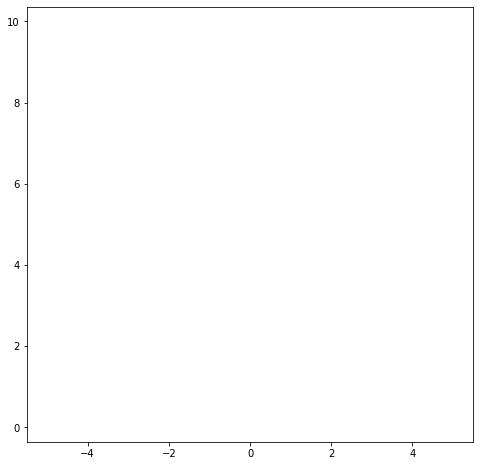

In [31]:
points = algorithm()

fig,ax = plt.subplots(figsize=(8,8))
ax.axis('equal')
ax.axis([-5.5,5.5, -0.5,10.5])
###################
### Simple plot ###
###################
#ax.scatter(points[:,0],points[:,1], s=1, c='g', marker='.')

## animation
l, = ax.plot([],[],'g.', markersize=1)
every = 50
def animate(i):
    l.set_data(points[:i*every,0], points[:i*every,1])

#################
### Animation ###
#################
anim=FuncAnimation(fig, animate, frames=N//every)
anim

## Interactive plot

In [30]:
def show_fractal(N, a1,a2,a3,a4,a5,a6,a7,a8,a9,a10,a11,a12,a13,a14,a15,a16,a17,a18,a19,a20,a21,a22,a23,a24,a25,a26,a27,a28):
    global from_array, algorithm
    a = np.array([a1,a2,a3,a4,a5,a6,a7,a8,a9,a10,a11,a12,a13,a14,a15,a16,a17,a18,a19,a20,a21,a22,a23,a24,a25,a26,a27,a28])
    ms,qs,ps = from_array(a)
    points = algorithm(mats=ms, quotes=qs, probs=ps, N=N)
    fig,ax = plt.subplots(figsize=(8,8))
    ax.axis('equal')
    ax.scatter(points[:,0],points[:,1], s=1, c='g', marker='.')
    plt.show()

dict_args = { "N": widgets.IntSlider(min=0, max=1e5, step=100, value=1000) }
for i in range(28):
    minval,maxval = (0.0,1.0) if i%7==6 else (-2.0,2.0)
    dict_args[f"a{i+1}"] = widgets.FloatSlider(min=minval, max=maxval, step=0.01, value=a[i])

interact_manual(
    show_fractal,
    **dict_args
);

Widget Javascript not detected.  It may not be installed or enabled properly. Reconnecting the current kernel may help.
